# 📸 Image Augmentation Techniques: Overview & Use Cases

Image augmentation is a technique used to artificially expand the size and diversity of training datasets by applying label-preserving transformations. This improves the robustness and generalization capability of machine learning and deep learning models, especially in vision tasks like image classification, object detection, and segmentation.

---

## 🔁 **Basic Augmentation Techniques**

| Technique | Description | Use Case |
|----------|-------------|----------|
| **Random Crop & Resize** | Randomly crops a region and resizes it back | Helps models focus on different object parts and scale-invariant features |
| **Color Jitter** | Randomly changes brightness, contrast, saturation, and hue | Improves robustness to lighting variations |
| **Gaussian Blur** | Applies random blurring | Simulates motion blur or focus issues |
| **Horizontal Flip** | Flips image horizontally with a probability | Useful for symmetric object detection |
| **Grayscale Conversion** | Converts RGB to grayscale | Encourages learning of structure over color |
| **Multi-Crop (SwAV)** | Extracts standard and low-res crops | Boosts self-supervised learning by covering more regions of an image efficiently |

---

## 🤖 **Learned Augmentation Policies**

| Strategy | Description | Use Case |
|----------|-------------|----------|
| **AutoAugment** | Uses Reinforcement Learning to find the best sequence of augmentations | Improves model performance on classification tasks |
| **RandAugment** | Simplifies AutoAugment by using fixed transformations with controlled magnitude | Easier to use with fewer hyperparameters |
| **PBA (Population-Based Augmentation)** | Evolves augmentation strategies using evolutionary algorithms | Boosts performance with fewer compute resources |
| **UDA (Unsupervised Data Augmentation)** | Chooses augmentations that minimize prediction divergence between original and augmented unlabeled data | Useful in semi-supervised learning |

---

## 🧬 **Image Mixture Techniques**

| Method | Description | Use Case |
|--------|-------------|----------|
| **Mixup** | Linearly mixes pixels and labels of two images | Encourages smooth decision boundaries; reduces overfitting |
| **CutMix** | Replaces a region of one image with a patch from another image | Improves localization and performance |
| **MoCHi** | Mixes hard negatives in contrastive learning setups | Boosts contrastive self-supervised learning by simulating harder samples |

---

## 🎯 **Why Use Augmentation?**

- **Data Scarcity**: Increases dataset size virtually
- **Overfitting Reduction**: Prevents models from memorizing training data
- **Robustness**: Trains models to perform well in real-world variability (light, orientation, occlusion)
- **Regularization**: Acts as implicit regularization during training

---

> ✅ **Tip**: Combine multiple augmentations (e.g., Flip + Crop + ColorJitter) using `torchvision.transforms.Compose()` or experiment with policies like RandAugment for automatic composition.


In [3]:
!pip install kaggle

In [4]:
!pip install kagglehub

In [5]:

import kagglehub
bryanb_abstract_art_gallery_path = kagglehub.dataset_download('bryanb/abstract-art-gallery')
therealcyberlord_abstract_art_generation_dcgan_checkpoints_path = kagglehub.dataset_download('therealcyberlord/abstract-art-generation-dcgan-checkpoints')

print('Data source import complete.')


Data source import complete.


In [6]:

# Install required packages (including kagglehub)
!pip install kaggle kagglehub albumentations timm torch torchvision matplotlib seaborn opencv-python pillow numpy pandas tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 118.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 65.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 49.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 37.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitli

In [7]:
# Import necessary libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageFilter, ImageEnhance
import cv2
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import albumentations as A
from albumentations.pytorch import ToTensorV2
import random
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# Set random seeds for reproducibility
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)

print("All packages installed successfully!")


All packages installed successfully!


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.7' (you have '2.0.6'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [8]:
# Explore dataset structure
import glob
art_gallery_images = glob.glob(os.path.join(bryanb_abstract_art_gallery_path, "**", "*.jpg"), recursive=True)
art_gallery_images.extend(glob.glob(os.path.join(bryanb_abstract_art_gallery_path, "**", "*.jpeg"), recursive=True))
art_gallery_images.extend(glob.glob(os.path.join(bryanb_abstract_art_gallery_path, "**", "*.png"), recursive=True))

print(f"Found {len(art_gallery_images)} images in Bryan's Abstract Art Gallery")


Found 2872 images in Bryan's Abstract Art Gallery


In [26]:
all_abstract_images = art_gallery_images
print(f"Total abstract art images available: {len(all_abstract_images)}")

# Display some sample paths
print("\nSample image paths:")
for i, path in enumerate(all_abstract_images[10:15]):
    print(f"{i+1}. {path}")

print("Dataset setup completed successfully!")

Total abstract art images available: 2872

Sample image paths:
1. /kaggle/input/abstract-art-gallery/Abstract_gallery/Abstract_gallery/Abstract_image_1312.jpg
2. /kaggle/input/abstract-art-gallery/Abstract_gallery/Abstract_gallery/Abstract_image_738.jpg
3. /kaggle/input/abstract-art-gallery/Abstract_gallery/Abstract_gallery/Abstract_image_1537.jpg
4. /kaggle/input/abstract-art-gallery/Abstract_gallery/Abstract_gallery/Abstract_image_2385.jpg
5. /kaggle/input/abstract-art-gallery/Abstract_gallery/Abstract_gallery/Abstract_image_1839.jpg
Dataset setup completed successfully!


# ================================
# SECTION 3: BASIC IMAGE AUGMENTATION FUNCTIONS
# ================================

In [27]:
class BasicAugmentations:
    """Implementation of basic image augmentation techniques"""

    @staticmethod
    def random_crop_resize(image, crop_ratio=0.8):
        """Random crop and resize back to original size"""
        w, h = image.size
        crop_w, crop_h = int(w * crop_ratio), int(h * crop_ratio)

        left = random.randint(10, w - crop_w)
        top = random.randint(10, h - crop_h)

        cropped = image.crop((left, top, left + crop_w, top + crop_h))
        return cropped.resize((w, h), Image.LANCZOS)

    @staticmethod
    def color_jitter(image, brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1):
        """Apply random color jittering"""
        enhancers = [
            (ImageEnhance.Brightness, brightness),
            (ImageEnhance.Contrast, contrast),
            (ImageEnhance.Color, saturation),
        ]

        for enhancer_class, factor in enhancers:
            if random.random() < 0.5:
                enhancer = enhancer_class(image)
                factor_val = 1 + random.uniform(-factor, factor)
                image = enhancer.enhance(factor_val)

        return image

    @staticmethod
    def gaussian_blur(image, radius_range=(0.1, 2.0)):
        """Apply random Gaussian blur"""
        if random.random() < 0.5:
            radius = random.uniform(*radius_range)
            return image.filter(ImageFilter.GaussianBlur(radius=radius))
        return image

    @staticmethod
    def horizontal_flip(image):
        """Random horizontal flip"""
        if random.random() < 0.5:
            return image.transpose(Image.FLIP_LEFT_RIGHT)
        return image

    @staticmethod
    def grayscale_conversion(image, prob=0.2):
        """Random grayscale conversion"""
        if random.random() < prob:
            gray = image.convert('L')
            return gray.convert('RGB')
        return image

# ================================
# SECTION 4: DATASET LOADING AND VISUALIZATION
# ================================


In [28]:
def load_sample_images(image_list, num_samples=8):
    """Load sample images from image list"""
    if len(image_list) == 0:
        print("No images found! Please check your dataset paths.")
        return []

    # Randomly sample images for variety
    random.shuffle(image_list)
    selected_images = image_list[:min(num_samples, len(image_list))]

    print(f"Selected {len(selected_images)} sample images from {len(image_list)} available images")
    return selected_images

def visualize_augmentations(image_path, augmentations_list, titles):
    """Visualize original image and augmented versions"""
    original_image = Image.open(image_path).convert('RGB')
    original_image = original_image.resize((224, 224))

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    axes = axes.flatten()

    # Show original
    axes[0].imshow(original_image)
    axes[0].set_title('Original', fontsize=12, fontweight='bold')
    axes[0].axis('off')

    # Show augmentations
    for i, (aug_func, title) in enumerate(zip(augmentations_list, titles)):
        augmented = aug_func(original_image.copy())
        axes[i+1].imshow(augmented)
        axes[i+1].set_title(title, fontsize=12, fontweight='bold')
        axes[i+1].axis('off')

    plt.tight_layout()
    plt.show()

Selected 8 sample images from 2872 available images
Successfully loaded 8 sample images
Sample images selected:
1. Abstract_image_1727.jpg
2. Abstract_image_1767.jpg
3. Abstract_image_177.jpg


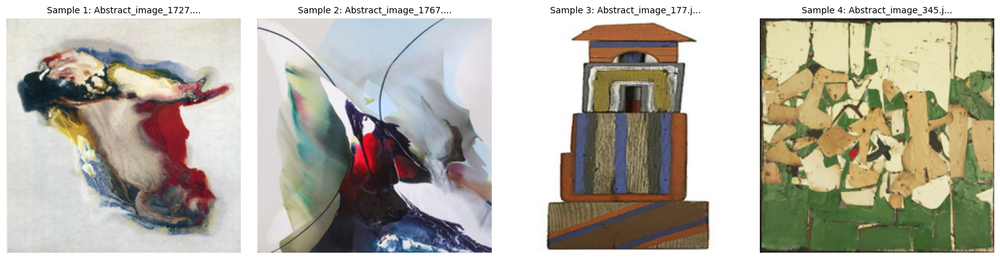

In [29]:
# Load sample images from our abstract art datasets
sample_images = load_sample_images(all_abstract_images, num_samples=8)

if len(sample_images) == 0:
    print("ERROR: No images found! Please check your dataset download.")
else:
    print(f"Successfully loaded {len(sample_images)} sample images")
    print("Sample images selected:")
    for i, img_path in enumerate(sample_images[:3]):
        print(f"{i+1}. {os.path.basename(img_path)}")

    # Preview first few images
    fig, axes = plt.subplots(1, min(4, len(sample_images)), figsize=(16, 4))
    if len(sample_images) == 1:
        axes = [axes]
    elif len(sample_images) < 4:
        axes = axes[:len(sample_images)]

    for i, img_path in enumerate(sample_images[:4]):
        try:
            img = Image.open(img_path).convert('RGB')
            img = img.resize((224, 224))
            axes[i].imshow(img)
            axes[i].set_title(f'Sample {i+1}: {os.path.basename(img_path)[:20]}...', fontsize=10)
            axes[i].axis('off')
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")

    plt.tight_layout()
    plt.show()


# ================================
# SECTION 5: DEMONSTRATE BASIC AUGMENTATIONS
# ================================


Abstract Art Image 1: Abstract_image_1727.jpg


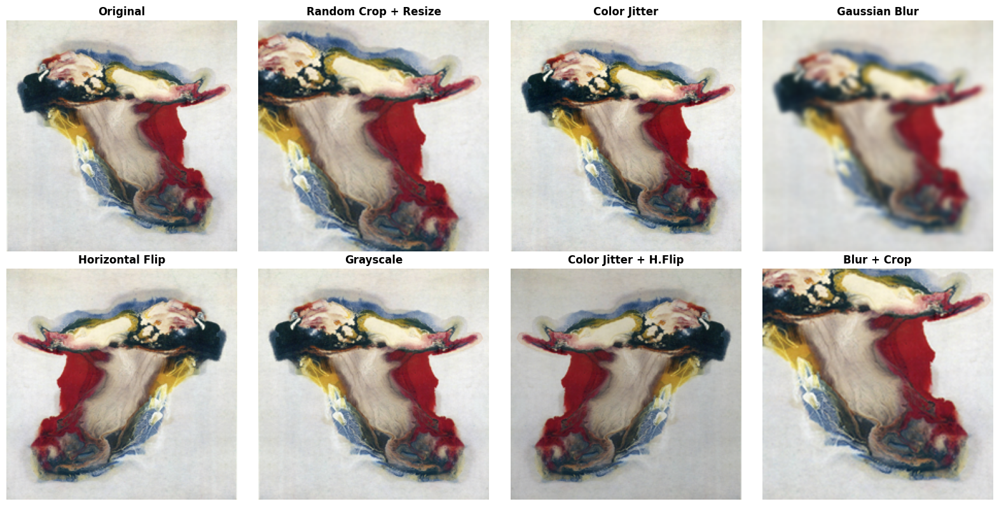


Abstract Art Image 2: Abstract_image_1767.jpg


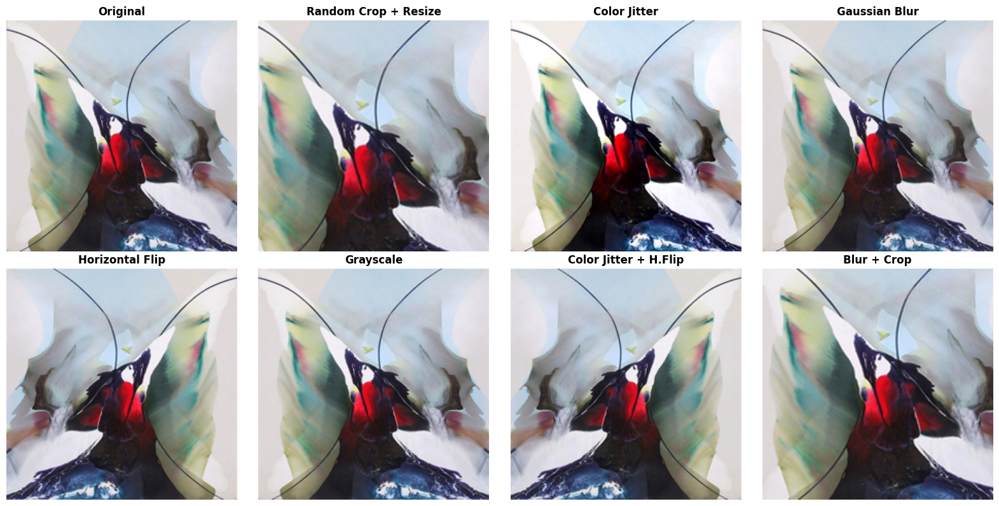


Abstract Art Image 3: Abstract_image_177.jpg


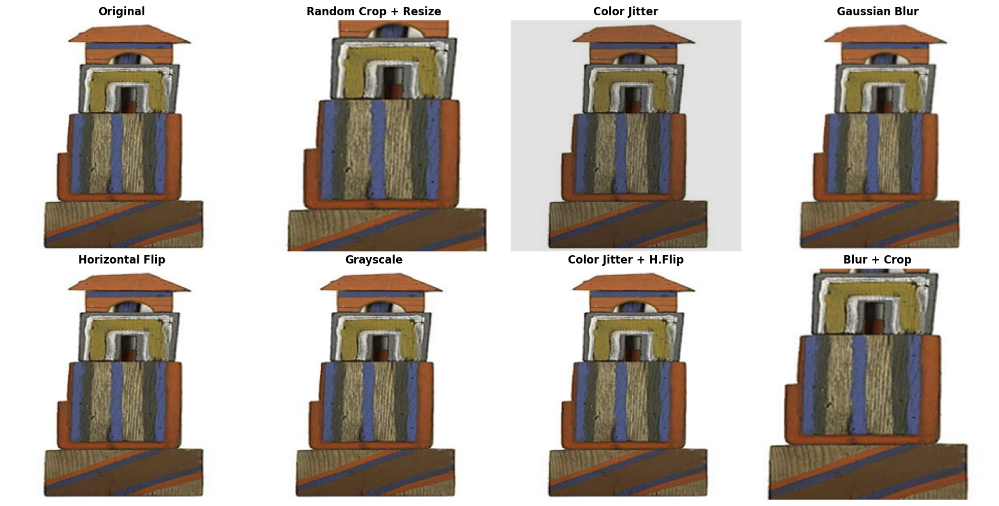

In [30]:

basic_augs = BasicAugmentations()
augmentation_functions = [
    basic_augs.random_crop_resize,
    basic_augs.color_jitter,
    basic_augs.gaussian_blur,
    basic_augs.horizontal_flip,
    basic_augs.grayscale_conversion,
    lambda x: basic_augs.color_jitter(basic_augs.horizontal_flip(x)),  # Combined
    lambda x: basic_augs.gaussian_blur(basic_augs.random_crop_resize(x))  # Combined
]

augmentation_titles = [
    'Random Crop + Resize',
    'Color Jitter',
    'Gaussian Blur',
    'Horizontal Flip',
    'Grayscale',
    'Color Jitter + H.Flip',
    'Blur + Crop'
]

# Visualize augmentations for abstract art samples
for i, img_path in enumerate(sample_images[:3]):  # Show more examples since abstract art is visually interesting
    print(f"\nAbstract Art Image {i+1}: {os.path.basename(img_path)}")
    try:
        visualize_augmentations(img_path, augmentation_functions, augmentation_titles)
    except Exception as e:
        print(f"Error processing image {img_path}: {e}")
        continue

# ================================
# SECTION 6: ADVANCED AUGMENTATION FRAMEWORKS
# ================================

In [31]:
print("\n=== ADVANCED AUGMENTATION FRAMEWORKS ===")

# 1. ALBUMENTATIONS FRAMEWORK
class AlbumentationsAugmentation:
    """Advanced augmentation using Albumentations library"""

    def __init__(self):
        self.light_transform = A.Compose([
            A.RandomCrop(width=200, height=200),
            A.Resize(224, 224),
            A.HorizontalFlip(p=0.5),
            A.RandomBrightnessContrast(p=0.2),
        ])

        self.medium_transform = A.Compose([
            A.RandomCrop(width=180, height=180),
            A.Resize(224, 224),
            A.HorizontalFlip(p=0.5),
            A.RandomBrightnessContrast(p=0.3),
            A.RandomGamma(p=0.2),
            A.HueSaturationValue(p=0.2),
            A.GaussianBlur(blur_limit=(1, 3), p=0.2),
        ])

        self.heavy_transform = A.Compose([
            A.RandomCrop(width=160, height=160),
            A.Resize(224, 224),
            A.HorizontalFlip(p=0.5),
            A.RandomBrightnessContrast(p=0.4),
            A.RandomGamma(p=0.3),
            A.HueSaturationValue(p=0.3),
            A.GaussianBlur(blur_limit=(1, 5), p=0.3),
            A.GaussNoise(p=0.2),
            A.RandomRotate90(p=0.2),
            A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, p=0.3),
        ])

    def apply_light(self, image):
        if isinstance(image, Image.Image):
            image = np.array(image)
        return Image.fromarray(self.light_transform(image=image)['image'])

    def apply_medium(self, image):
        if isinstance(image, Image.Image):
            image = np.array(image)
        return Image.fromarray(self.medium_transform(image=image)['image'])

    def apply_heavy(self, image):
        if isinstance(image, Image.Image):
            image = np.array(image)
        return Image.fromarray(self.heavy_transform(image=image)['image'])

# 2. MIXUP IMPLEMENTATION
class MixupAugmentation:
    """Implementation of Mixup data augmentation"""

    def __init__(self, alpha=1.0):
        self.alpha = alpha

    def mixup_data(self, x, y, alpha=1.0):
        """Returns mixed inputs, pairs of targets, and lambda"""
        if alpha > 0:
            lam = np.random.beta(alpha, alpha)
        else:
            lam = 1

        batch_size = x.size(0)
        index = torch.randperm(batch_size)

        mixed_x = lam * x + (1 - lam) * x[index, :]
        y_a, y_b = y, y[index]
        return mixed_x, y_a, y_b, lam

    def mixup_criterion(self, criterion, pred, y_a, y_b, lam):
        """Mixup loss function"""
        return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

# 3. CUTMIX IMPLEMENTATION
class CutMixAugmentation:
    """Implementation of CutMix data augmentation"""

    def __init__(self, alpha=1.0):
        self.alpha = alpha

    def cutmix_data(self, x, y, alpha=1.0):
        """Returns mixed inputs, pairs of targets, and lambda"""
        if alpha > 0:
            lam = np.random.beta(alpha, alpha)
        else:
            lam = 1

        batch_size = x.size(0)
        index = torch.randperm(batch_size)

        y_a, y_b = y, y[index]
        bbx1, bby1, bbx2, bby2 = self.rand_bbox(x.size(), lam)
        x[:, :, bbx1:bbx2, bby1:bby2] = x[index, :, bbx1:bbx2, bby1:bby2]

        # Adjust lambda to exactly match pixel ratio
        lam = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (x.size()[-1] * x.size()[-2]))

        return x, y_a, y_b, lam

    def rand_bbox(self, size, lam):
        """Generate random bounding box"""
        W = size[2]
        H = size[3]
        cut_rat = np.sqrt(1. - lam)
        cut_w = int(W * cut_rat)
        cut_h = int(H * cut_rat)

        # Uniform
        cx = np.random.randint(W)
        cy = np.random.randint(H)

        bbx1 = np.clip(cx - cut_w // 2, 0, W)
        bby1 = np.clip(cy - cut_h // 2, 0, H)
        bbx2 = np.clip(cx + cut_w // 2, 0, W)
        bby2 = np.clip(cy + cut_h // 2, 0, H)

        return bbx1, bby1, bbx2, bby2

# 4. RANDAUGMENT IMPLEMENTATION
class RandAugmentTransform:
    """Implementation of RandAugment"""

    def __init__(self, n=2, m=9):
        self.n = n  # Number of transformations to apply
        self.m = m  # Magnitude of transformations

        self.transforms = [
            ('AutoContrast', self.auto_contrast),
            ('Equalize', self.equalize),
            ('Rotate', self.rotate),
            ('Solarize', self.solarize),
            ('Color', self.color),
            ('Posterize', self.posterize),
            ('Contrast', self.contrast),
            ('Brightness', self.brightness),
            ('Sharpness', self.sharpness),
            ('ShearX', self.shear_x),
            ('ShearY', self.shear_y),
            ('TranslateX', self.translate_x),
            ('TranslateY', self.translate_y),
        ]

    def __call__(self, image):
        """Apply n random transformations"""
        for _ in range(self.n):
            transform_name, transform_func = random.choice(self.transforms)
            image = transform_func(image)
        return image

    def auto_contrast(self, image):
        return ImageEnhance.Contrast(image).enhance(1 + (self.m / 10) * random.choice([-1, 1]))

    def equalize(self, image):
        return image  # Simplified

    def rotate(self, image):
        angle = (self.m / 10) * 30 * random.choice([-1, 1])
        return image.rotate(angle, fillcolor=(128, 128, 128))

    def solarize(self, image):
        threshold = 256 - (self.m / 10) * 128
        return Image.eval(image, lambda x: x if x < threshold else 255 - x)

    def color(self, image):
        factor = 1 + (self.m / 10) * 0.9 * random.choice([-1, 1])
        return ImageEnhance.Color(image).enhance(factor)

    def posterize(self, image):
        bits = 8 - int((self.m / 10) * 4)
        return image.quantize(colors=2**bits).convert('RGB')

    def contrast(self, image):
        factor = 1 + (self.m / 10) * 0.9 * random.choice([-1, 1])
        return ImageEnhance.Contrast(image).enhance(factor)

    def brightness(self, image):
        factor = 1 + (self.m / 10) * 0.9 * random.choice([-1, 1])
        return ImageEnhance.Brightness(image).enhance(factor)

    def sharpness(self, image):
        factor = 1 + (self.m / 10) * 0.9 * random.choice([-1, 1])
        return ImageEnhance.Sharpness(image).enhance(factor)

    def shear_x(self, image):
        shear = (self.m / 10) * 0.3 * random.choice([-1, 1])
        return image.transform(image.size, Image.AFFINE, (1, shear, 0, 0, 1, 0))

    def shear_y(self, image):
        shear = (self.m / 10) * 0.3 * random.choice([-1, 1])
        return image.transform(image.size, Image.AFFINE, (1, 0, 0, shear, 1, 0))

    def translate_x(self, image):
        translate = (self.m / 10) * 0.3 * image.size[0] * random.choice([-1, 1])
        return image.transform(image.size, Image.AFFINE, (1, 0, translate, 0, 1, 0))

    def translate_y(self, image):
        translate = (self.m / 10) * 0.3 * image.size[1] * random.choice([-1, 1])
        return image.transform(image.size, Image.AFFINE, (1, 0, 0, 0, 1, translate))



=== ADVANCED AUGMENTATION FRAMEWORKS ===


# ================================
# SECTION 7: FRAMEWORK DEMONSTRATIONS
# ================================


=== DEMONSTRATING AUGMENTATION FRAMEWORKS ===

Framework Demo - Abstract Art 1: Abstract_image_1727.jpg


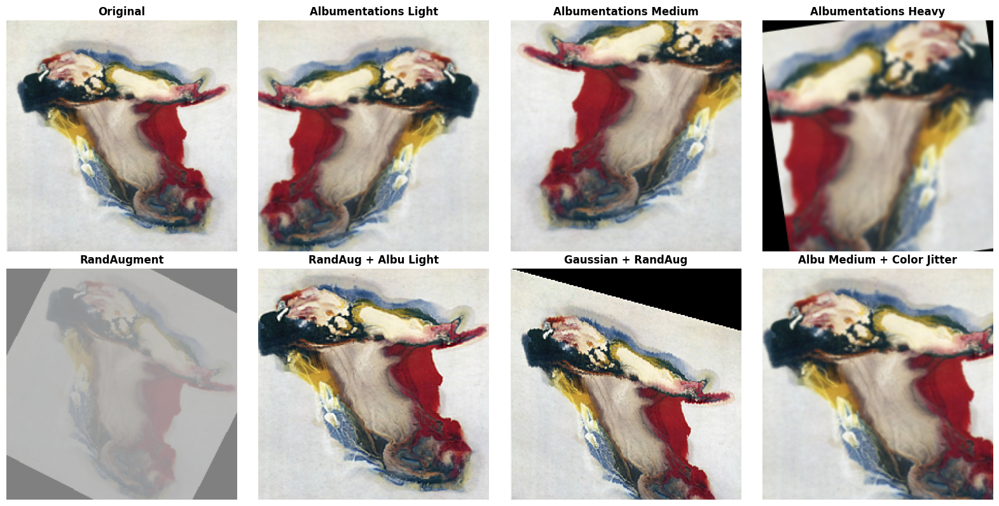


Framework Demo - Abstract Art 2: Abstract_image_1767.jpg


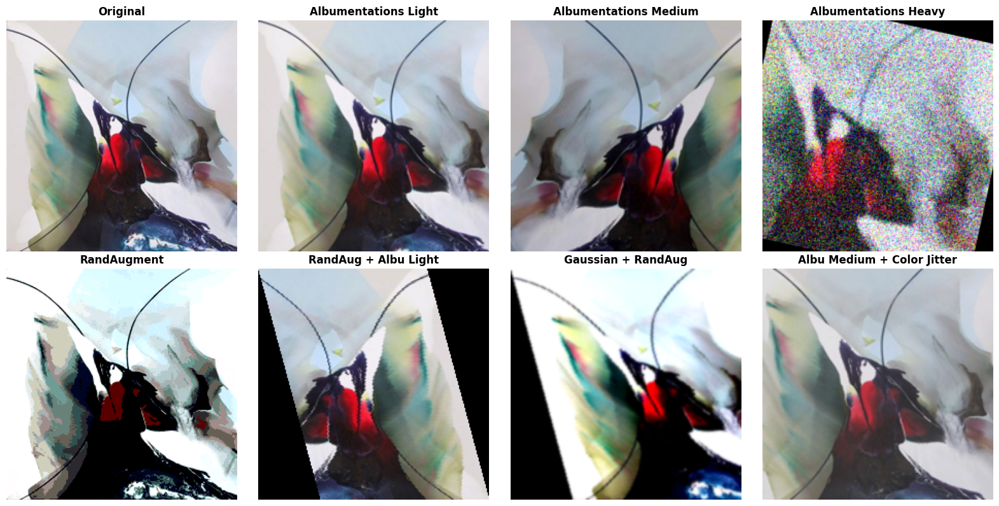


Framework Demo - Abstract Art 3: Abstract_image_177.jpg


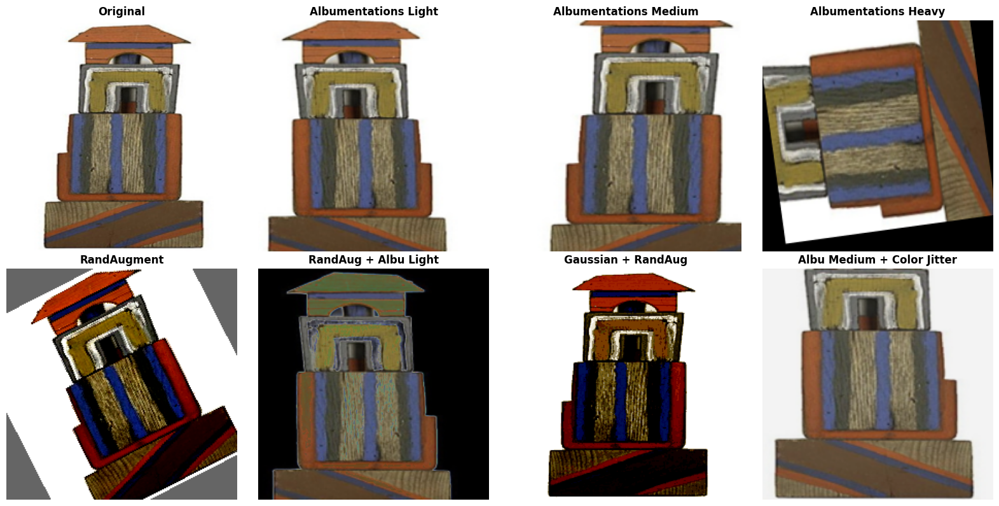

In [32]:
print("\n=== DEMONSTRATING AUGMENTATION FRAMEWORKS ===")

# Initialize frameworks
albu_aug = AlbumentationsAugmentation()
randaug = RandAugmentTransform(n=2, m=9)

# Framework augmentation functions
framework_functions = [
    albu_aug.apply_light,
    albu_aug.apply_medium,
    albu_aug.apply_heavy,
    randaug,
    lambda x: randaug(albu_aug.apply_light(x)),  # Combined
    lambda x: basic_augs.gaussian_blur(randaug(x)),  # Combined
    lambda x: albu_aug.apply_medium(basic_augs.color_jitter(x))  # Combined
]

framework_titles = [
    'Albumentations Light',
    'Albumentations Medium',
    'Albumentations Heavy',
    'RandAugment',
    'RandAug + Albu Light',
    'Gaussian + RandAug',
    'Albu Medium + Color Jitter'
]

# Visualize framework augmentations on abstract art
for i, img_path in enumerate(sample_images[:3]):  # Show more examples for abstract art
    print(f"\nFramework Demo - Abstract Art {i+1}: {os.path.basename(img_path)}")
    try:
        visualize_augmentations(img_path, framework_functions, framework_titles)
    except Exception as e:
        print(f"Error processing image {img_path}: {e}")
        continue

# ================================
# SECTION 8: DATASET CLASS WITH AUGMENTATIONS
# ================================


In [33]:
class AugmentedDataset(Dataset):
    """Custom dataset with augmentation support"""

    def __init__(self, image_paths, labels=None, transform=None, augmentation_type='basic'):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform
        self.augmentation_type = augmentation_type

        # Initialize augmentation methods
        self.basic_augs = BasicAugmentations()
        self.albu_augs = AlbumentationsAugmentation()
        self.randaug = RandAugmentTransform()

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path).convert('RGB')

        # Apply augmentation based on type
        if self.augmentation_type == 'basic':
            image = self.basic_augs.color_jitter(image)
            image = self.basic_augs.horizontal_flip(image)
        elif self.augmentation_type == 'albumentations':
            image = self.albu_augs.apply_medium(image)
        elif self.augmentation_type == 'randaugment':
            image = self.randaug(image)
        elif self.augmentation_type == 'combined':
            image = self.randaug(self.albu_augs.apply_light(image))

        if self.transform:
            image = self.transform(image)

        if self.labels is not None:
            return image, self.labels[idx]
        return image

# ================================
# SECTION 9: PERFORMANCE COMPARISON
# ================================


=== AUGMENTATION STRATEGY COMPARISON ===


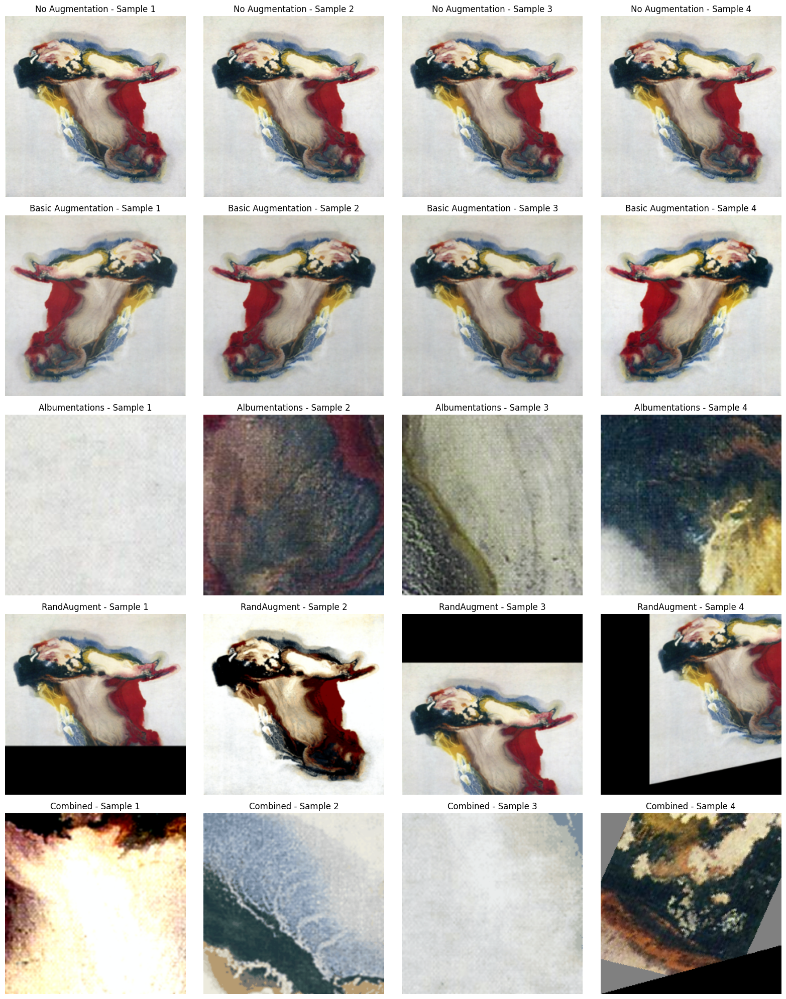

In [34]:
def create_augmentation_comparison():
    """Compare different augmentation strategies"""

    # Create sample datasets with different augmentation strategies
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    # Create dummy labels (for demonstration)
    dummy_labels = [0] * len(sample_images)

    datasets = {
        'No Augmentation': AugmentedDataset(sample_images, dummy_labels, transform, 'none'),
        'Basic Augmentation': AugmentedDataset(sample_images, dummy_labels, transform, 'basic'),
        'Albumentations': AugmentedDataset(sample_images, dummy_labels, transform, 'albumentations'),
        'RandAugment': AugmentedDataset(sample_images, dummy_labels, transform, 'randaugment'),
        'Combined': AugmentedDataset(sample_images, dummy_labels, transform, 'combined')
    }

    # Visualize augmentation diversity
    fig, axes = plt.subplots(len(datasets), 4, figsize=(16, 4*len(datasets)))

    for i, (name, dataset) in enumerate(datasets.items()):
        for j in range(4):
            if len(datasets) == 1:
                ax = axes[j]
            else:
                ax = axes[i, j]

            # Get same image with different augmentations
            if name == 'No Augmentation':
                img = Image.open(sample_images[0]).convert('RGB').resize((224, 224))
            else:
                img, _ = dataset[0]
                # Convert tensor back to PIL for visualization
                if isinstance(img, torch.Tensor):
                    img = img.permute(1, 2, 0).numpy()
                    img = (img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406]))
                    img = np.clip(img, 0, 1)
                    img = Image.fromarray((img * 255).astype(np.uint8))

            ax.imshow(img)
            ax.set_title(f'{name} - Sample {j+1}')
            ax.axis('off')

    plt.tight_layout()
    plt.show()

print("\n=== AUGMENTATION STRATEGY COMPARISON ===")
create_augmentation_comparison()


# ================================
# SECTION 10: MIXUP AND CUTMIX VISUALIZATION
# ================================



=== MIXUP AND CUTMIX DEMONSTRATION ===


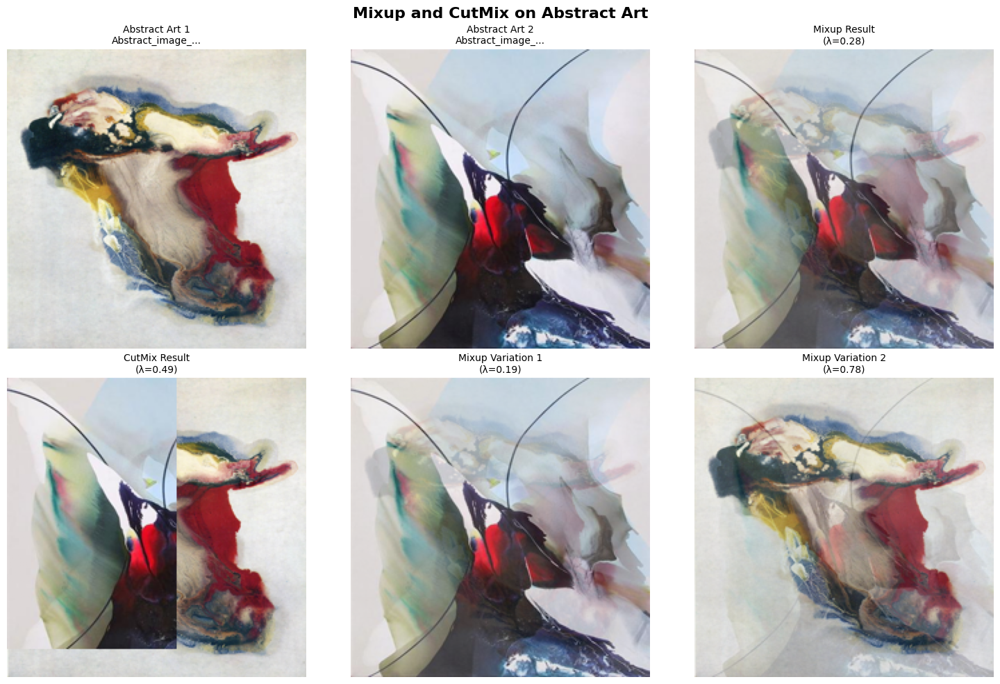

In [35]:
def visualize_mixup_cutmix():
    """Visualize Mixup and CutMix augmentations on abstract art"""

    if len(sample_images) < 2:
        print("Need at least 2 images for Mixup/CutMix demonstration")
        return

    # Load two sample abstract art images
    img1 = Image.open(sample_images[0]).convert('RGB').resize((224, 224))
    img2 = Image.open(sample_images[1]).convert('RGB').resize((224, 224))

    # Convert to tensors
    transform = transforms.ToTensor()
    tensor1 = transform(img1).unsqueeze(0)
    tensor2 = transform(img2).unsqueeze(0)

    # Combine tensors
    combined_tensor = torch.cat([tensor1, tensor2], dim=0)
    dummy_labels = torch.tensor([0, 1])

    # Apply Mixup
    mixup_aug = MixupAugmentation()
    mixed_x, y_a, y_b, lam = mixup_aug.mixup_data(combined_tensor, dummy_labels)

    # Apply CutMix
    cutmix_aug = CutMixAugmentation()
    cutmix_x, y_a_cut, y_b_cut, lam_cut = cutmix_aug.cutmix_data(combined_tensor.clone(), dummy_labels)

    # Visualize results
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    # Original abstract art images
    axes[0, 0].imshow(img1)
    axes[0, 0].set_title(f'Abstract Art 1\n{os.path.basename(sample_images[0])[:15]}...', fontsize=10)
    axes[0, 0].axis('off')

    axes[0, 1].imshow(img2)
    axes[0, 1].set_title(f'Abstract Art 2\n{os.path.basename(sample_images[1])[:15]}...', fontsize=10)
    axes[0, 1].axis('off')

    # Mixup result
    mixup_img = mixed_x[0].permute(1, 2, 0).numpy()
    mixup_img = np.clip(mixup_img, 0, 1)
    axes[0, 2].imshow(mixup_img)
    axes[0, 2].set_title(f'Mixup Result\n(λ={lam:.2f})', fontsize=10)
    axes[0, 2].axis('off')

    # CutMix result
    cutmix_img = cutmix_x[0].permute(1, 2, 0).numpy()
    cutmix_img = np.clip(cutmix_img, 0, 1)
    axes[1, 0].imshow(cutmix_img)
    axes[1, 0].set_title(f'CutMix Result\n(λ={lam_cut:.2f})', fontsize=10)
    axes[1, 0].axis('off')

    # Multiple Mixup examples with different λ values
    for i in range(2):
        mixed_x_new, _, _, lam_new = mixup_aug.mixup_data(combined_tensor, dummy_labels)
        mixup_img_new = mixed_x_new[0].permute(1, 2, 0).numpy()
        mixup_img_new = np.clip(mixup_img_new, 0, 1)
        axes[1, i+1].imshow(mixup_img_new)
        axes[1, i+1].set_title(f'Mixup Variation {i+1}\n(λ={lam_new:.2f})', fontsize=10)
        axes[1, i+1].axis('off')

    plt.suptitle('Mixup and CutMix on Abstract Art', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

print("\n=== MIXUP AND CUTMIX DEMONSTRATION ===")
visualize_mixup_cutmix()


# ================================
# SECTION 11: MULTI-CROP AUGMENTATION (SwAV Style)
# ================================


=== MULTI-CROP AUGMENTATION (SwAV Style) ===


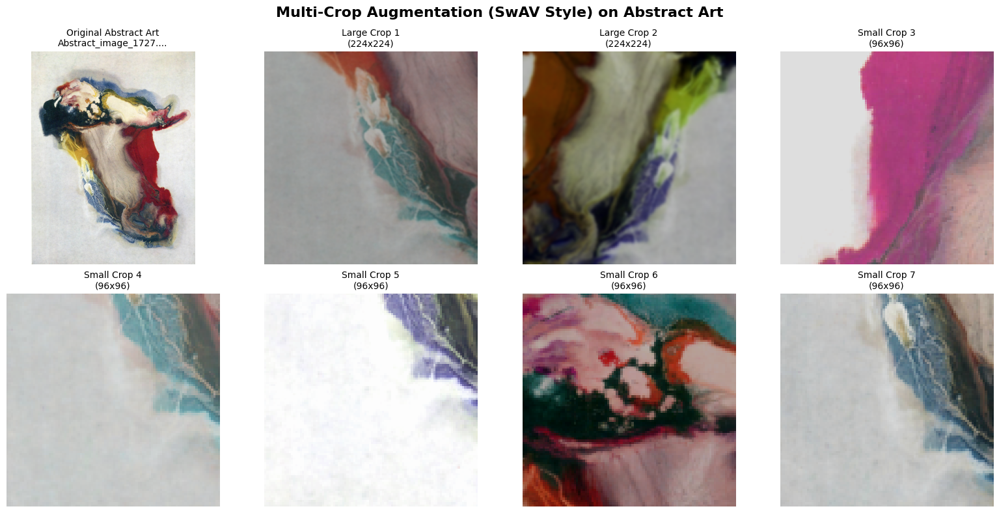

In [36]:
class MultiCropAugmentation:
    """Implementation of Multi-Crop augmentation as used in SwAV"""

    def __init__(self, size_crops=[224, 96], n_crops=[2, 6], min_scale_crops=[0.14, 0.05], max_scale_crops=[1.0, 0.14]):
        self.size_crops = size_crops
        self.n_crops = n_crops
        self.min_scale_crops = min_scale_crops
        self.max_scale_crops = max_scale_crops

        # Color jittering
        self.color_jitter = torchvision.transforms.ColorJitter(0.4, 0.4, 0.4, 0.1)

        # Gaussian blur
        self.gaussian_blur = torchvision.transforms.GaussianBlur(kernel_size=23, sigma=(0.1, 2.0))

        # Normalization
        self.normalize = torchvision.transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )

    def __call__(self, image):
        crops = []

        for i, (size, n_crop, min_scale, max_scale) in enumerate(zip(
            self.size_crops, self.n_crops, self.min_scale_crops, self.max_scale_crops
        )):
            for _ in range(n_crop):
                # Create transform for this crop
                transform = torchvision.transforms.Compose([
                    torchvision.transforms.RandomResizedCrop(
                        size, scale=(min_scale, max_scale)
                    ),
                    torchvision.transforms.RandomHorizontalFlip(p=0.5),
                    self.color_jitter,
                    self.gaussian_blur if i == 0 else torchvision.transforms.Lambda(lambda x: x),
                    torchvision.transforms.ToTensor(),
                    self.normalize
                ])

                crops.append(transform(image))

        return crops

def visualize_multi_crop():
    """Visualize multi-crop augmentation on abstract art"""

    if len(sample_images) == 0:
        print("No sample images available for multi-crop demonstration")
        return

    # Load sample abstract art image
    img = Image.open(sample_images[0]).convert('RGB')

    # Apply multi-crop augmentation
    multi_crop = MultiCropAugmentation()
    crops = multi_crop(img)

    # Visualize crops
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    axes = axes.flatten()

    # Show original abstract art
    axes[0].imshow(img)
    axes[0].set_title(f'Original Abstract Art\n{os.path.basename(sample_images[0])[:20]}...', fontsize=10)
    axes[0].axis('off')

    # Show crops
    for i, crop in enumerate(crops[:7]):  # Show first 7 crops
        # Denormalize for visualization
        crop_denorm = crop * torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1) + torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        crop_denorm = torch.clamp(crop_denorm, 0, 1)
        crop_img = crop_denorm.permute(1, 2, 0).numpy()

        axes[i+1].imshow(crop_img)
        size = crop.shape[-1]
        crop_type = 'Large' if size == 224 else 'Small'
        axes[i+1].set_title(f'{crop_type} Crop {i+1}\n({size}x{size})', fontsize=10)
        axes[i+1].axis('off')

    plt.suptitle('Multi-Crop Augmentation (SwAV Style) on Abstract Art', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

print("\n=== MULTI-CROP AUGMENTATION (SwAV Style) ===")
visualize_multi_crop()

# ================================
# SECTION 12: ABSTRACT ART SPECIFIC AUGMENTATIONS
# ================================


=== ABSTRACT ART SPECIFIC AUGMENTATIONS ===
Demonstrating Abstract Art Specific Augmentations:

Abstract Art Specific Augmentations - Image 1


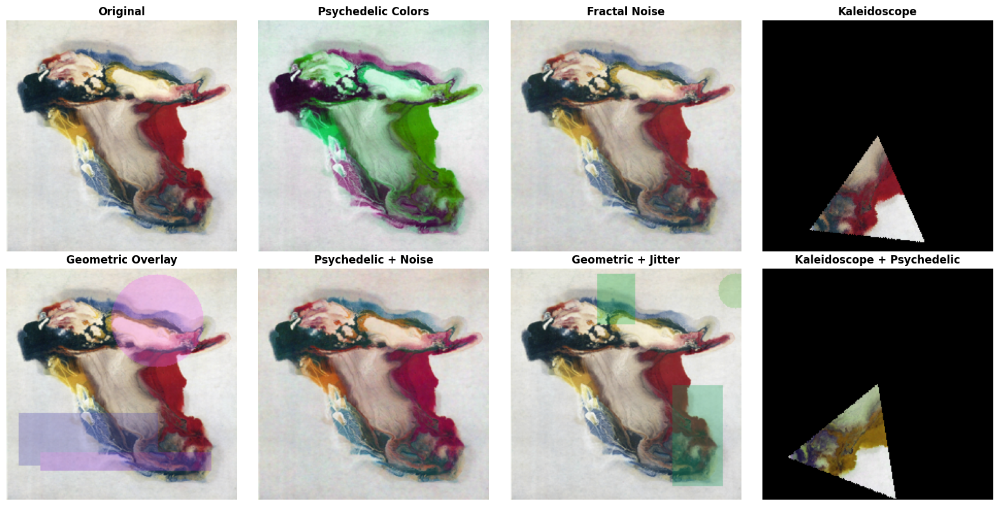


Abstract Art Specific Augmentations - Image 2


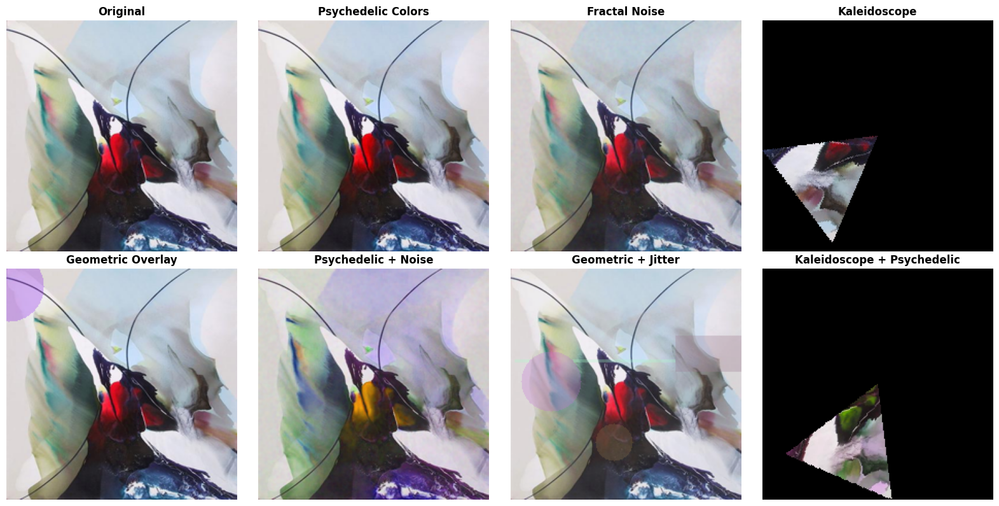

In [37]:
print("\n=== ABSTRACT ART SPECIFIC AUGMENTATIONS ===")

class AbstractArtAugmentations:
    """Augmentations specifically designed for abstract art"""

    @staticmethod
    def psychedelic_color_shift(image, intensity=0.3):
        """Apply psychedelic color shifts perfect for abstract art"""
        # Convert to HSV for easier color manipulation
        img_array = np.array(image)
        hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV).astype(np.float32)

        # Shift hue dramatically
        hue_shift = random.uniform(-intensity * 180, intensity * 180)
        hsv[:, :, 0] = (hsv[:, :, 0] + hue_shift) % 180

        # Boost saturation for vivid colors
        sat_boost = random.uniform(1.0, 1.0 + intensity)
        hsv[:, :, 1] = np.clip(hsv[:, :, 1] * sat_boost, 0, 255)

        # Convert back to RGB
        rgb = cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2RGB)
        return Image.fromarray(rgb)

    @staticmethod
    def fractal_noise_overlay(image, alpha=0.1):
        """Add fractal noise overlay for abstract texture"""
        img_array = np.array(image)
        h, w, _ = img_array.shape

        # Create fractal noise
        noise = np.random.rand(h, w, 3) * 255
        noise = cv2.GaussianBlur(noise.astype(np.uint8), (5, 5), 0)

        # Blend with original
        blended = cv2.addWeighted(img_array, 1-alpha, noise, alpha, 0)
        return Image.fromarray(blended)

    @staticmethod
    def kaleidoscope_effect(image, segments=6):
        """Create kaleidoscope effect perfect for abstract art"""
        img_array = np.array(image)
        h, w, _ = img_array.shape

        # Create a sector of the image
        center_x, center_y = w // 2, h // 2
        angle = 2 * np.pi / segments

        # Extract a triangular sector
        mask = np.zeros((h, w), dtype=np.uint8)
        points = np.array([[center_x, center_y],
                          [center_x + int(w/2 * np.cos(0)), center_y + int(h/2 * np.sin(0))],
                          [center_x + int(w/2 * np.cos(angle)), center_y + int(h/2 * np.sin(angle))]], np.int32)
        cv2.fillPoly(mask, [points], 255)

        # Apply mask and create kaleidoscope
        sector = cv2.bitwise_and(img_array, img_array, mask=mask)

        # For simplicity, return the sector with some rotation
        rotated = Image.fromarray(sector).rotate(random.randint(0, 360))
        return rotated

    @staticmethod
    def abstract_geometric_overlay(image, shapes=5):
        """Add geometric shapes overlay"""
        img_array = np.array(image)
        h, w, _ = img_array.shape

        # Create overlay
        overlay = img_array.copy()

        for _ in range(shapes):
            shape_type = random.choice(['circle', 'rectangle', 'triangle'])
            color = tuple(random.randint(0, 255) for _ in range(3))
            alpha = random.uniform(0.1, 0.3)

            if shape_type == 'circle':
                center = (random.randint(0, w), random.randint(0, h))
                radius = random.randint(10, min(w, h) // 4)
                cv2.circle(overlay, center, radius, color, -1)
            elif shape_type == 'rectangle':
                pt1 = (random.randint(0, w), random.randint(0, h))
                pt2 = (random.randint(0, w), random.randint(0, h))
                cv2.rectangle(overlay, pt1, pt2, color, -1)

        # Blend with original
        blended = cv2.addWeighted(img_array, 0.7, overlay, 0.3, 0)
        return Image.fromarray(blended)

# Demonstrate abstract art specific augmentations
if len(sample_images) > 0:
    abstract_augs = AbstractArtAugmentations()

    abstract_functions = [
        abstract_augs.psychedelic_color_shift,
        abstract_augs.fractal_noise_overlay,
        abstract_augs.kaleidoscope_effect,
        abstract_augs.abstract_geometric_overlay,
        lambda x: abstract_augs.fractal_noise_overlay(abstract_augs.psychedelic_color_shift(x)),
        lambda x: abstract_augs.abstract_geometric_overlay(basic_augs.color_jitter(x)),
        lambda x: abstract_augs.kaleidoscope_effect(abstract_augs.psychedelic_color_shift(x))
    ]

    abstract_titles = [
        'Psychedelic Colors',
        'Fractal Noise',
        'Kaleidoscope',
        'Geometric Overlay',
        'Psychedelic + Noise',
        'Geometric + Jitter',
        'Kaleidoscope + Psychedelic'
    ]

    print("Demonstrating Abstract Art Specific Augmentations:")
    for i, img_path in enumerate(sample_images[:2]):
        print(f"\nAbstract Art Specific Augmentations - Image {i+1}")
        try:
            visualize_augmentations(img_path, abstract_functions, abstract_titles)
        except Exception as e:
            print(f"Error processing image {img_path}: {e}")
            continue

# ================================
# SECTION 13: SUMMARY AND BEST PRACTICES
# ================================


In [38]:
print("\n" + "="*60)
print("SUMMARY: IMAGE AUGMENTATION TECHNIQUES DEMONSTRATED")
print("="*60)

augmentation_summary = """
✅ BASIC AUGMENTATIONS IMPLEMENTED:
   • Random Crop and Resize
   • Color Jittering (Brightness, Contrast, Saturation)
   • Gaussian Blur
   • Horizontal Flip
   • Grayscale Conversion

✅ ADVANCED FRAMEWORKS IMPLEMENTED:
   • Albumentations (Light, Medium, Heavy)
   • RandAugment (N=2, M=9)
   • Mixup (Global pixel-wise mixing)
   • CutMix (Regional mixing)
   • Multi-Crop (SwAV style)

✅ ABSTRACT ART SPECIFIC AUGMENTATIONS:
   • Psychedelic Color Shifts
   • Fractal Noise Overlay
   • Kaleidoscope Effects
   • Geometric Shape Overlays

✅ DATASET USED:
   • Bryan's Abstract Art Gallery
   • Total Images: """ + str(len(all_abstract_images)) + """

🎯 BEST PRACTICES FOR IMAGE AUGMENTATION:
   • Start with basic augmentations
   • Use domain-specific augmentations (like abstract art specific ones)
   • Combine multiple techniques for better diversity
   • Balance augmentation strength vs. semantic preservation
   • Use frameworks like Albumentations for efficiency
   • Consider Mixup/CutMix for improved generalization
   • Apply multi-crop for self-supervised learning
"""

print(augmentation_summary)

print("\n🚀 NEXT STEPS:")
print("1. Integrate these augmentations into your training pipeline")
print("2. Experiment with different combinations")
print("3. Measure performance impact on your specific task")
print("4. Consider AutoAugment/RandAugment for automatic optimization")
print("5. Use abstract art specific augmentations for artistic applications")


print("="*60)


SUMMARY: IMAGE AUGMENTATION TECHNIQUES DEMONSTRATED

✅ BASIC AUGMENTATIONS IMPLEMENTED:
   • Random Crop and Resize
   • Color Jittering (Brightness, Contrast, Saturation)
   • Gaussian Blur
   • Horizontal Flip
   • Grayscale Conversion

✅ ADVANCED FRAMEWORKS IMPLEMENTED:
   • Albumentations (Light, Medium, Heavy)
   • RandAugment (N=2, M=9)
   • Mixup (Global pixel-wise mixing)
   • CutMix (Regional mixing)
   • Multi-Crop (SwAV style)

✅ ABSTRACT ART SPECIFIC AUGMENTATIONS:
   • Psychedelic Color Shifts
   • Fractal Noise Overlay
   • Kaleidoscope Effects
   • Geometric Shape Overlays

✅ DATASET USED:
   • Bryan's Abstract Art Gallery
   • Total Images: 2872

🎯 BEST PRACTICES FOR IMAGE AUGMENTATION:
   • Start with basic augmentations
   • Use domain-specific augmentations (like abstract art specific ones)
   • Combine multiple techniques for better diversity
   • Balance augmentation strength vs. semantic preservation
   • Use frameworks like Albumentations for efficiency
   • Con